In [1]:
'''
Notes: 
    How many instances are there in the dataset?  
        df.info() --> 569 entries
    How many columns/features? 
        df.info() --> 32 columns which in this case are the features of the FNA
    Is the diagnosis balance equal? 
        No, there are more bening diagnosis the malign according to the dataset
    Which features determine if the diagnosis is B or M?
    preprocessing 
    
    What type of features are they?
        most data types are float64
        for diagnosis its an object (B/M) transform to 0/1?
    What's the basic, descriptive stats for the features? 
    
    How many classes are there?
        Two clasees (B/M)
    What are the classes called?
        Benign and Malign 
    How many instances are there of each class? 
        358 for benign 
        211 for malign 
'''


"\nNotes: \n    How many instances are there in the dataset?  \n        df.info() --> 569 entries\n    How many columns/features? \n        df.info() --> 32 columns which in this case are the features of the FNA\n    Is the diagnosis balance equal? \n        No, there are more bening diagnosis the malign according to the dataset\n    Which features determine if the diagnosis is B or M?\n    preprocessing \n    \n    What type of features are they?\n        most data types are float64\n        for diagnosis its an object (B/M) transform to 0/1?\n    What's the basic, descriptive stats for the features? \n    \n    How many classes are there?\n        Two clasees (B/M)\n    What are the classes called?\n        Benign and Malign \n    How many instances are there of each class? \n        358 for benign \n        211 for malign \n"

In [2]:
# Data, Datasets & Utils
import pandas as pd
from pandas.plotting import scatter_matrix
import pprint
import numpy as np
from time import time
from numpy import log2 as log

# Validation methods
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold

# Metrics
from sklearn import metrics
from sklearn.metrics import make_scorer
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

# Classifiers
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB

# Hyper-parameter optimisation
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Feature selection & feature engineering
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler

# Stats
from scipy.stats import randint as sp_randint
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from scipy.stats import shapiro     # Shapiro Wilk
from scipy.stats import normaltest  # D’Agostino’s K^2
from scipy.stats import anderson    # Anderson-Darling
from scipy.stats import ttest_ind    # independent student t-test; assumes normality
from scipy.stats import mannwhitneyu # non-parametric; doesn't assume normality

# Visualisation
import matplotlib.pyplot as plot 
import seaborn as sns
from IPython.display import SVG
from graphviz import Source
from IPython.display import display
from sklearn.tree import export_graphviz


In [3]:
df = pd.read_csv('data/breast-cancer.csv')

print("Shape:\n",df.shape) #tells us how many rows and columns the data structer has got

print(df.size, "\n") #returns the number of elements in the object

print("\nUnique Values in 'Diagnosis'\n", list(df.Diagnosis.unique()))

print(df.info())

df.head()


Shape:
 (569, 32)
18208 


Unique Values in 'Diagnosis'
 ['M', 'B']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          568 non-null    float64
 1   Radius (Mean)               550 non-null    float64
 2   Texture (Mean)              568 non-null    float64
 3   Perimeter (Mean)            567 non-null    float64
 4   Area (Mean)                 566 non-null    float64
 5   Smoothness (Mean)           567 non-null    float64
 6   Compactness (Mean)          566 non-null    float64
 7   Concavity (Mean)            569 non-null    float64
 8   Concave Points (Mean)       569 non-null    float64
 9   Symmetry (Mean)             566 non-null    float64
 10  Fractal Dimension (Mean)    567 non-null    float64
 11  Radius (Error)              551 non-null    float64
 12   Texture (Error)        

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst),Diagnosis
0,842302.0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,NaN,0.4601,0.11890,M
1,842517.0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,84300903.0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,84348301.0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,84358402.0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


In [4]:
df.tail()

,ID,Radius (Mean),Texture (Mean),Perimeter (Mean),Area (Mean),Smoothness (Mean),Compactness (Mean),Concavity (Mean),Concave Points (Mean),Symmetry (Mean),...,Texture (Worst),Perimeter (Worst),Area (Worst),Smoothness (Worst),Compactness (Worst),Concavity (Worst),Concave Points (Worst),Symmetry (Worst),Fractal Dimension (Worst),Diagnosis
564,926424.0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,M
565,926682.0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,M
566,926954.0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,M
567,927241.0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,M
568,92751.0,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,B


In [5]:
print(df.iloc[:,21:31].describe()) #compute several descriptive statistic of the passed array

        Radius (Worst)   Texture (Worst)   Perimeter (Worst)   Area (Worst)  \
count       551.000000        566.000000          567.000000     566.000000   
mean         16.275134         25.629170          107.235326     879.487986   
std           4.847944          6.115881           33.609513     569.722315   
min           7.930000         12.020000           50.410000     185.200000   
25%          13.030000         21.065000           84.135000     515.425000   
50%          14.970000         25.370000           97.660000     685.550000   
75%          18.655000         29.497500          125.250000    1065.000000   
max          36.040000         49.540000          251.200000    4254.000000   

        Smoothness (Worst)   Compactness (Worst)   Concavity (Worst)  \
count           569.000000            565.000000          567.000000   
mean              0.132369              0.254019            0.272220   
std               0.022832              0.157306            0.208649   



Info about the class

count     569
unique      2
top         B
freq      358
Name: Diagnosis, dtype: object 

B    358
M    211
Name: Diagnosis, dtype: int64


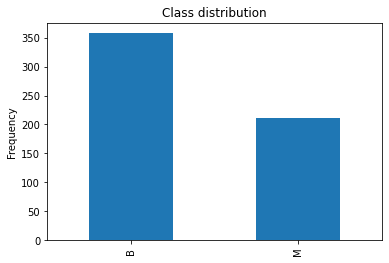

In [6]:
print("\nInfo about the class\n")

print(df['Diagnosis'].describe(),"\n")

# a bar chart for the 'class' distribution
print(df['Diagnosis'].value_counts())
df['Diagnosis'].value_counts().plot(kind='bar', title='Class distribution'); #how many are what 
plot.ylabel('Frequency')
#B meaning benign
#M meaning malign 
benign = df['Diagnosis'] == "B"
malign = df['Diagnosis'] == "M"


AxesSubplot(0.125,0.125;0.775x0.755)


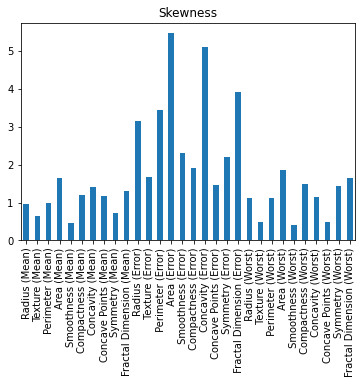

In [7]:
#skewness is a measure of the asymmetry of the probability distribution of a real-valued random variable about its mean. 

print(df.drop(columns=["ID"]).skew().plot(kind='bar', title='Skewness'))


 Radius (Mean)             Radius (Mean)               1.000000
                          Texture (Mean)              0.329534
                          Perimeter (Mean)            0.997779
                          Area (Mean)                 0.999613
                          Smoothness (Mean)           0.154970
                                                        ...   
Fractal Dimension (Mean)  Compactness (Mean)          0.498397
                          Concavity (Mean)            0.259728
                          Concave Points (Mean)       0.144130
                          Symmetry (Mean)             0.425672
                          Fractal Dimension (Mean)    1.000000
Length: 100, dtype: float64


Text(0.5, 1.0, "Spearman's Correlation matrix of Breast Cancer Features")

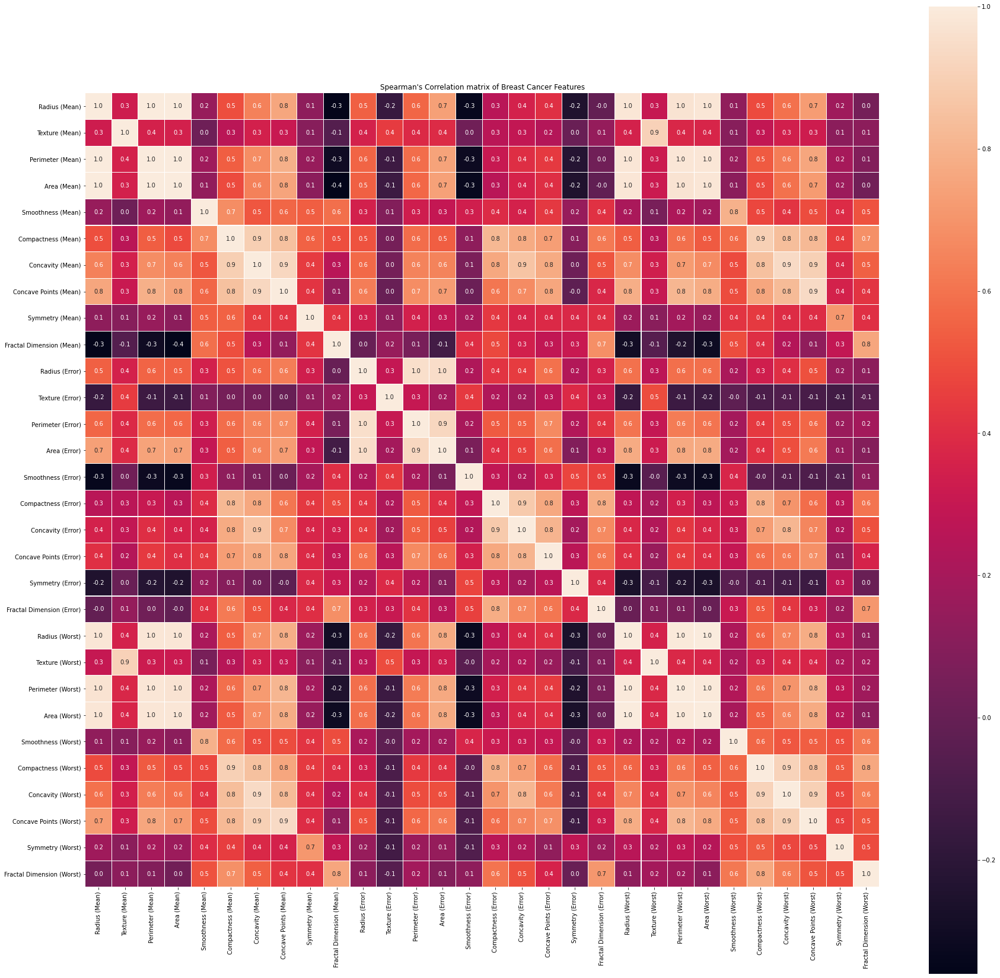

In [8]:
#spearman correlation 
corre = df.drop(columns=["ID"]).iloc[:,:10].corr(method='spearman')
print("\n",corre.unstack())

#full correlation matrix
fig, ax = plot.subplots(figsize=(30,30))
df_mean = df.drop(columns=["ID"])
corrs = df_mean.corr(method='spearman')
sns.heatmap(data=corrs, linewidths=.1, annot=True ,fmt= '.1f', square=True )
plot.title("Spearman's Correlation matrix of Breast Cancer Features")


Text(0.5, 1.0, "Spearman's Correlation matrix of Breast Cancer on Benign Diagnosis")

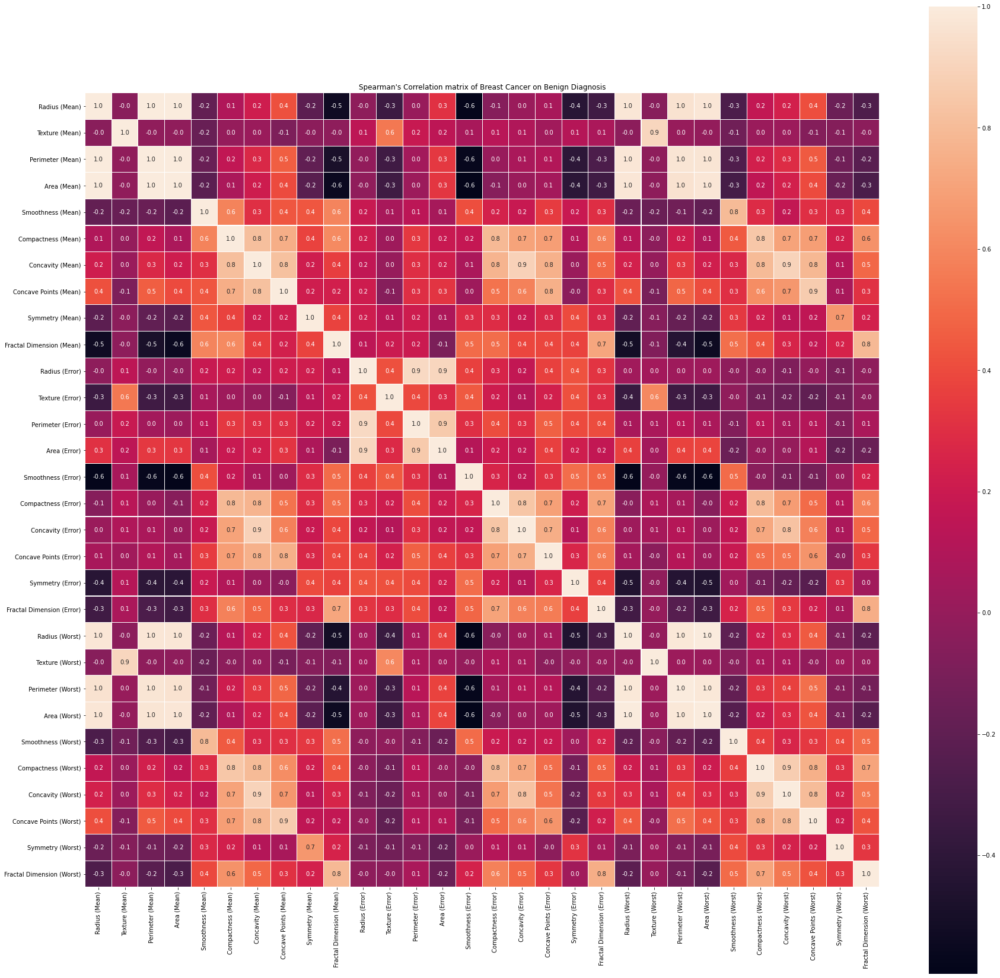

In [9]:
#correlation for benign diagnosis
fig, ax = plot.subplots(figsize=(30,30))
df_mean = df[benign].drop(columns=["ID"])
corrs = df_mean.corr(method='spearman')
sns.heatmap(data=corrs, linewidths=.1, annot=True ,fmt= '.1f', square=True )
plot.title("Spearman's Correlation matrix of Breast Cancer on Benign Diagnosis")

Text(0.5, 1.0, "Spearman's Correlation matrix of Breast Cancer on Malign Diagnosis")

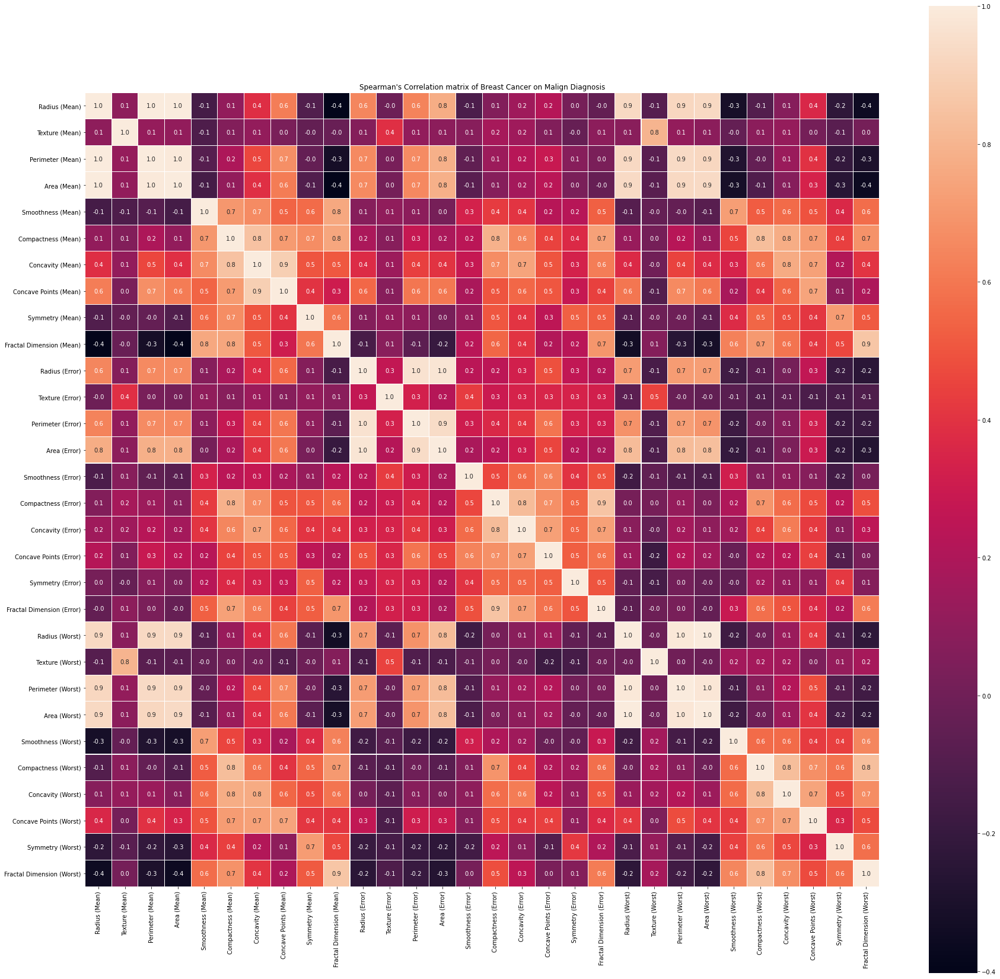

In [10]:
#correlation for malign diagnosis
fig, ax = plot.subplots(figsize=(30,30))
df_mean = df[malign].drop(columns=["ID"])
corrs = df_mean.corr(method='spearman')
sns.heatmap(data=corrs, linewidths=.1, annot=True ,fmt= '.1f', square=True )
plot.title("Spearman's Correlation matrix of Breast Cancer on Malign Diagnosis")


 Radius (Mean)             Radius (Mean)               1.000000
                          Texture (Mean)              0.315092
                          Perimeter (Mean)            0.997846
                          Area (Mean)                 0.987104
                          Smoothness (Mean)           0.176281
                                                        ...   
Fractal Dimension (Mean)  Compactness (Mean)          0.564522
                          Concavity (Mean)            0.337720
                          Concave Points (Mean)       0.167725
                          Symmetry (Mean)             0.477908
                          Fractal Dimension (Mean)    1.000000
Length: 100, dtype: float64


Text(0.5, 1.0, "Pearson's Correlation matrix of Breast Cancer  Features")

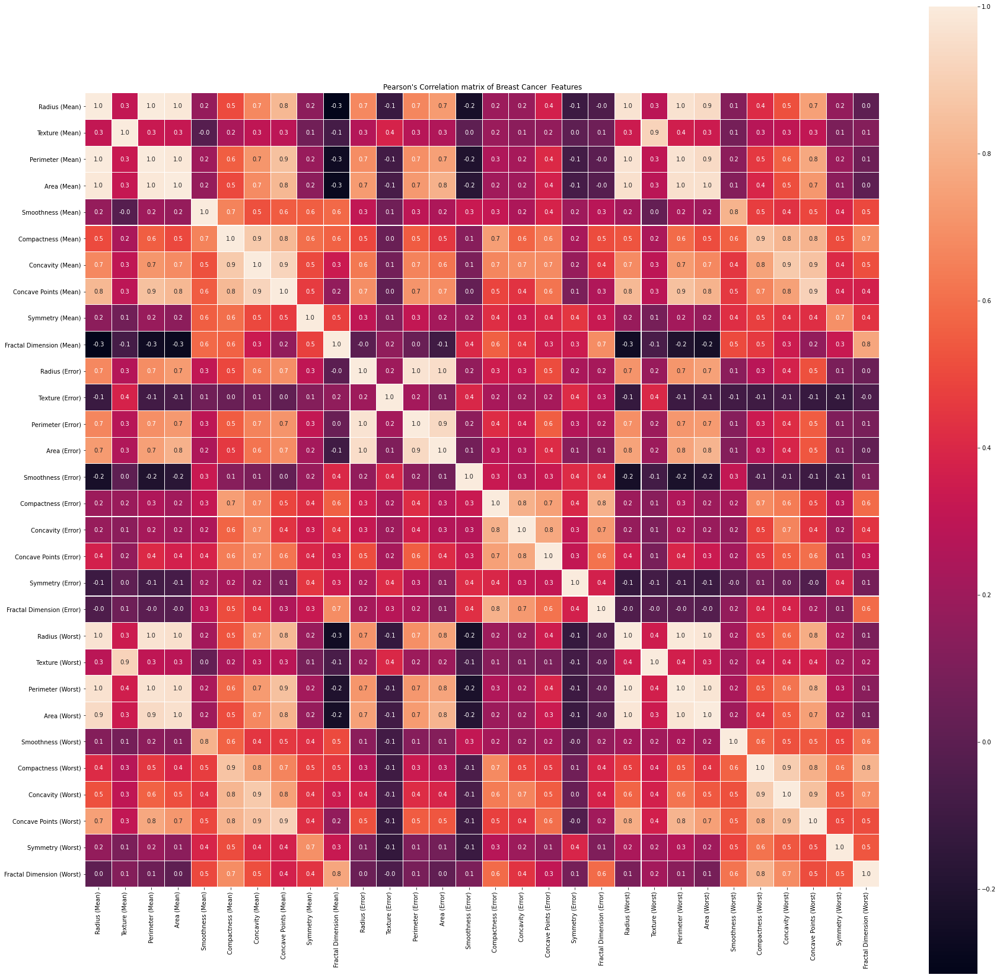

In [11]:
#pearson correlation 
corr = df.drop(columns=["ID"]).iloc[:,:10].corr(method='pearson')
print("\n",corr.unstack())

fig, ax = plot.subplots(figsize=(30,30))
df_mean = df.drop(columns=["ID"])
corr = df_mean.corr(method='pearson')
sns.heatmap(data=corr, linewidths=.1, annot=True ,fmt= '.1f', square=True )
plot.title("Pearson's Correlation matrix of Breast Cancer  Features")


Text(0.5, 1.0, "Pearson's Correlation matrix of Breast Cancer on Benign Diagnosis")

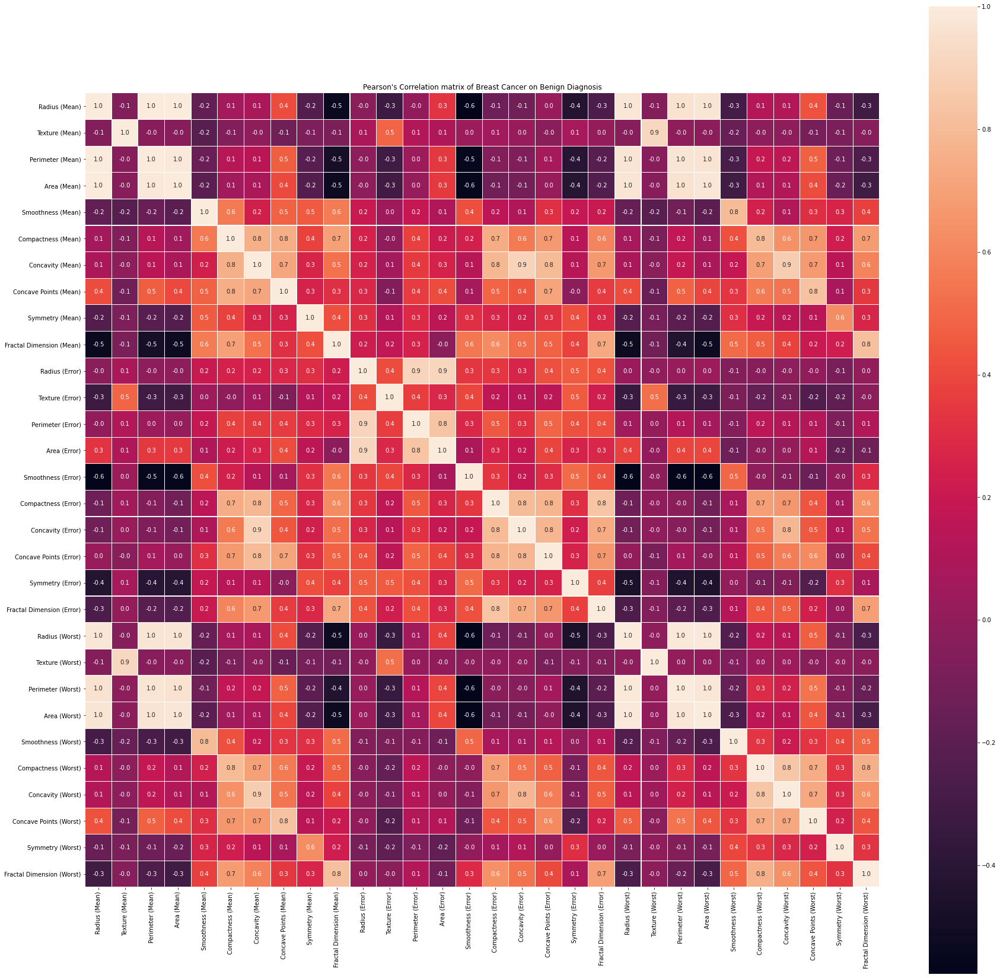

In [12]:
#correlation for benign diagnosis
fig, ax = plot.subplots(figsize=(30,30))
df_mean = df[benign].drop(columns=["ID"])
corrs = df_mean.corr(method='pearson')
sns.heatmap(data=corrs, linewidths=.1, annot=True ,fmt= '.1f', square=True )
plot.title("Pearson's Correlation matrix of Breast Cancer on Benign Diagnosis")

Text(0.5, 1.0, "Pearson's Correlation matrix of Breast Cancer on Malign Diagnosis")

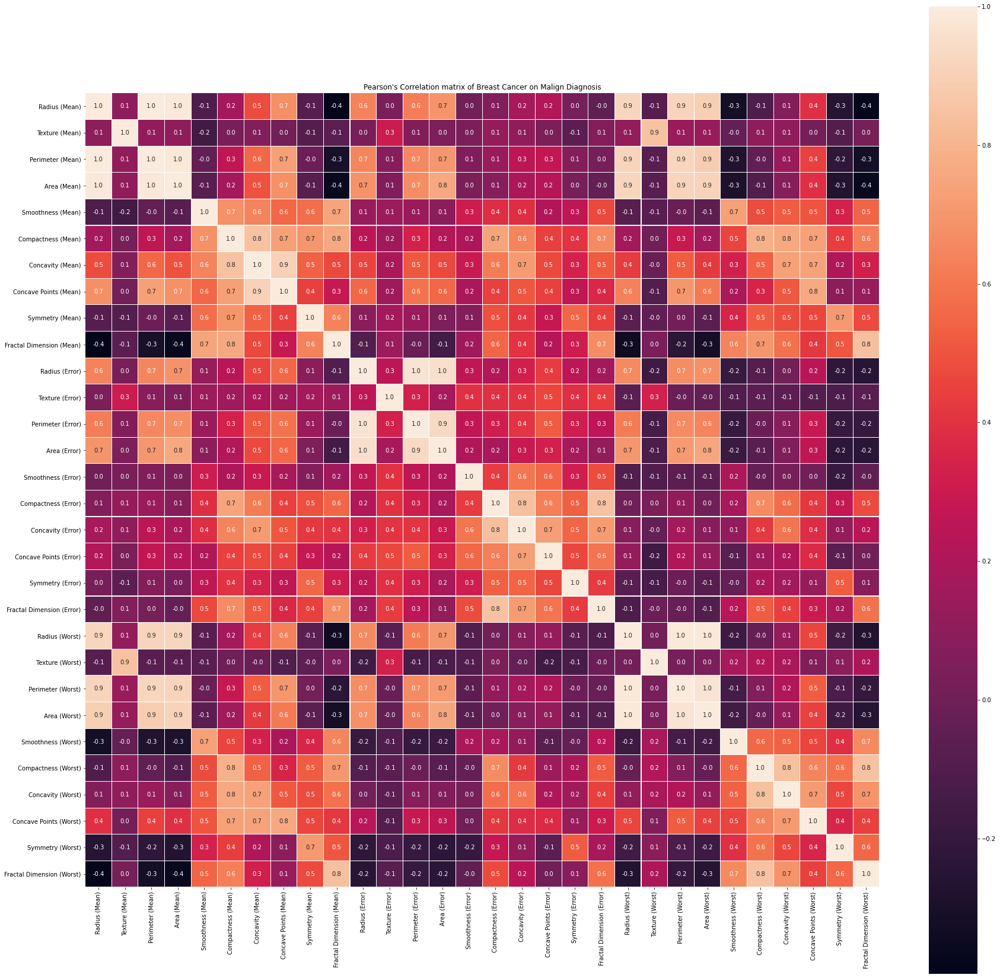

In [13]:
#correlation for malign diagnosis
fig, ax = plot.subplots(figsize=(30,30))
df_mean = df[malign].drop(columns=["ID"])
corrs = df_mean.corr(method='pearson')
sns.heatmap(data=corrs, linewidths=.1, annot=True ,fmt= '.1f', square=True )
plot.title("Pearson's Correlation matrix of Breast Cancer on Malign Diagnosis")

In [21]:
df['Diagnosis'].replace('M',1,inplace=True)
df['Diagnosis'].replace('B', 0,inplace=True)

names = df.columns
scaler = MinMaxScaler() 
df = scaler.fit_transform(df) 
df = pd.DataFrame(scaled_df, columns=names)

In [22]:
#In statistics, the standard deviation is a measure of the amount of variation or dispersion of a set of values. Square root of variance
print(df.drop(columns=["ID"]).std())


Radius (Mean)                 0.164320
Texture (Mean)                0.145286
Perimeter (Mean)              0.167798
Area (Mean)                   0.148995
Smoothness (Mean)             0.126833
Compactness (Mean)            0.161608
Concavity (Mean)              0.186785
Concave Points (Mean)         0.192857
Symmetry (Mean)               0.138071
Fractal Dimension (Mean)      0.148704
Radius (Error)                0.099068
 Texture (Error)              0.121564
 Perimeter (Error)            0.095220
 Area (Error)                 0.084836
 Smoothness (Error)           0.102023
 Compactness (Error)          0.134496
 Concavity (Error)            0.076230
 Concave Points (Error)       0.116768
 Symmetry (Error)             0.116296
 Fractal Dimension (Error)    0.091411
 Radius (Worst)               0.169903
 Texture (Worst)              0.162573
 Perimeter (Worst)            0.167115
 Area (Worst)                 0.139695
 Smoothness (Worst)           0.150779
 Compactness (Worst)     

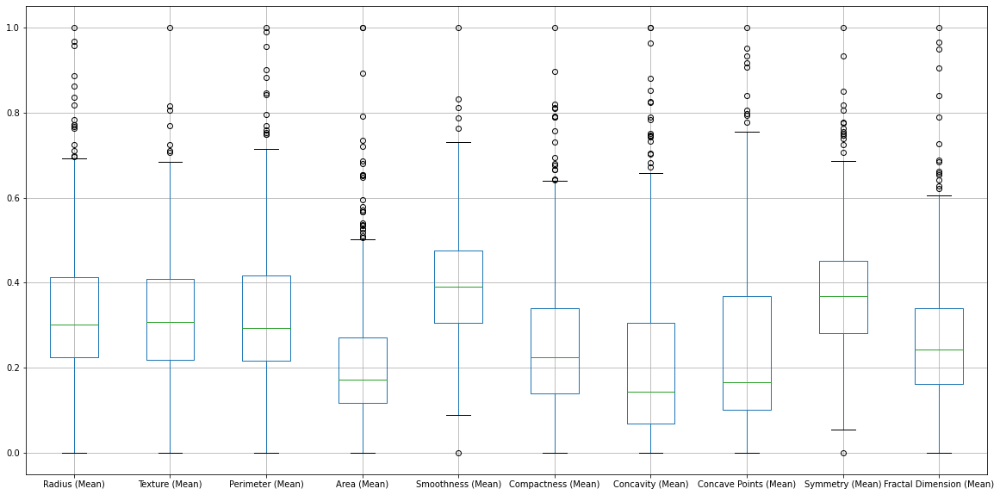

In [23]:
#Boxplots to detect outliers in the Mean features
df_mean_feat = df.drop(columns=["ID"]).iloc[:,:10]
df_mean_feat.boxplot(figsize=(20,10));

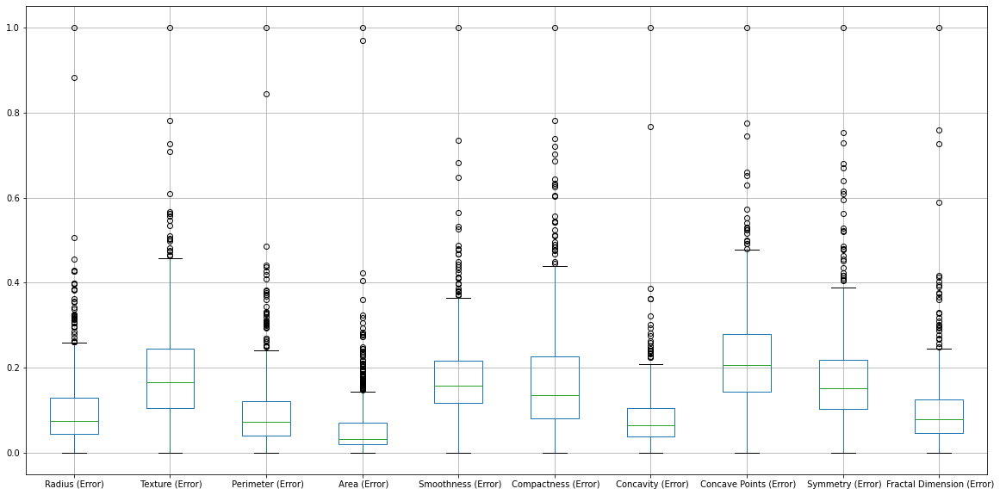

In [28]:
#Boxplots to detect outliers in the Mean features
df_mean_feat = df.drop(columns=["ID"]).iloc[:,10:20]
df_mean_feat.boxplot(figsize=(20,10));

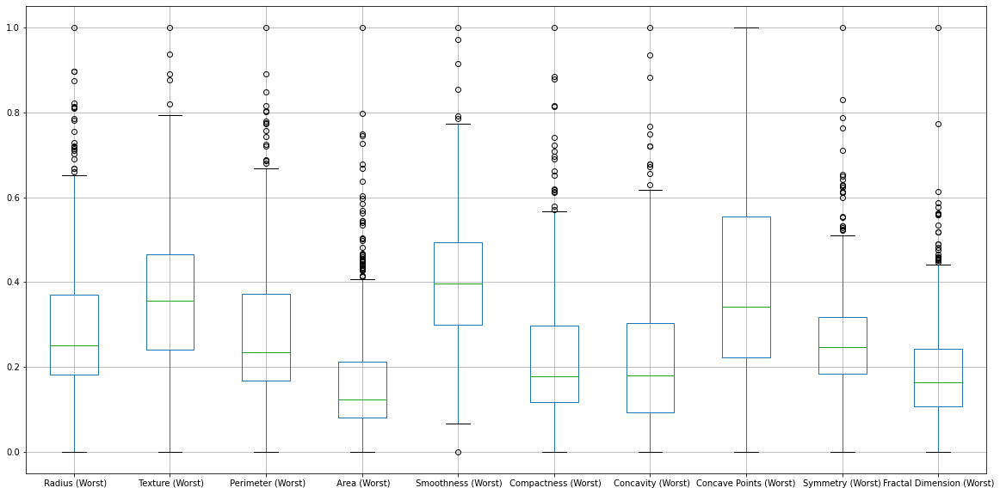

In [29]:
#Boxplots to detect outliers in the Mean features
df_mean_feat = df.drop(columns=["ID"]).iloc[:,20:30]
df_mean_feat.boxplot(figsize=(20,10));

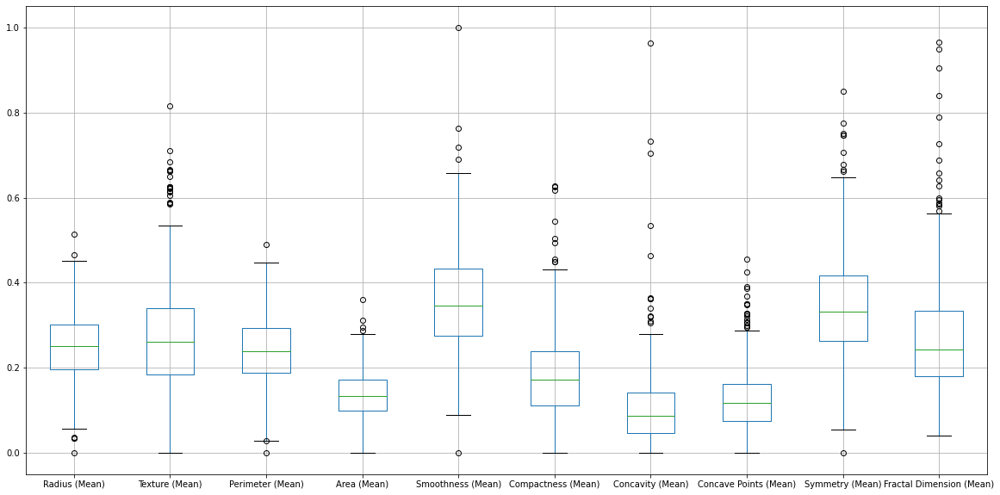

In [24]:
#detectiting outliers in benign Mean features
df_mean_feat = df.drop(columns=["ID"]).iloc[:,:10]
df_mean_feat[benign].boxplot(figsize=(20,10));

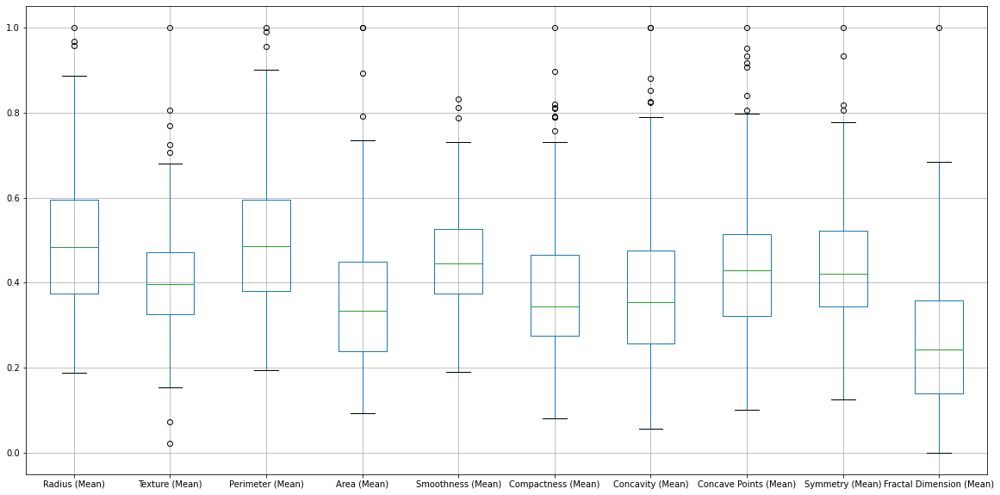

In [25]:
df_mean = df.drop(columns=["ID"]).iloc[:,:10]
df_mean[malign].boxplot(figsize=(20,10));

<Figure size 432x288 with 0 Axes>

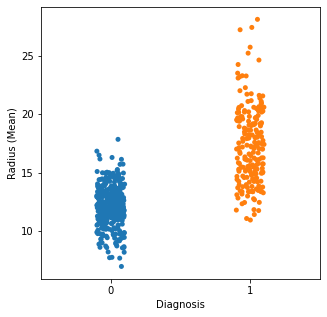

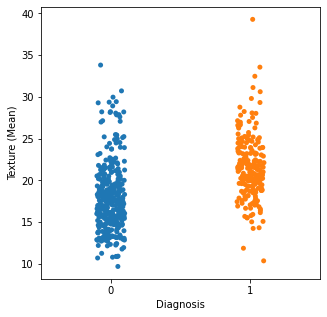

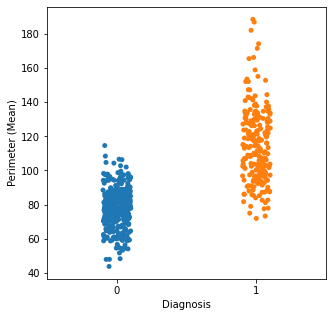

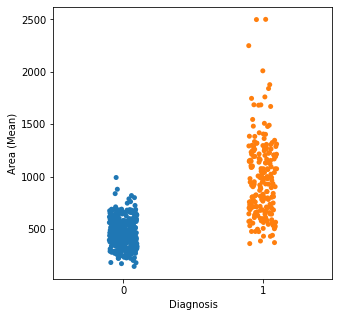

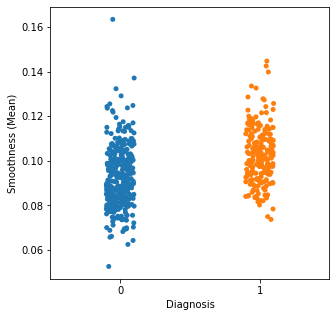

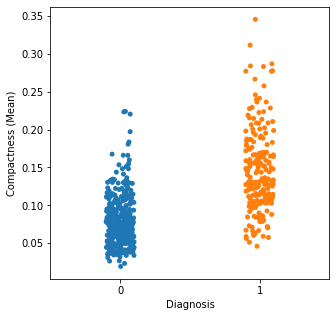

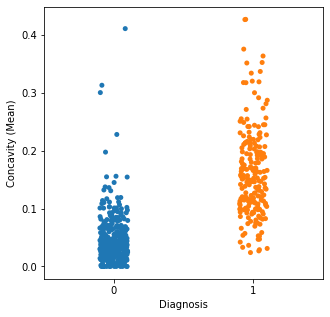

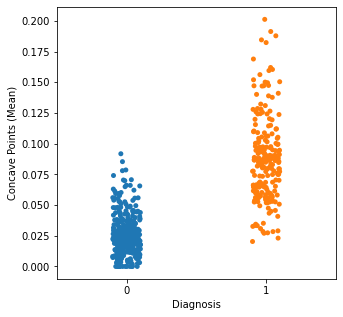

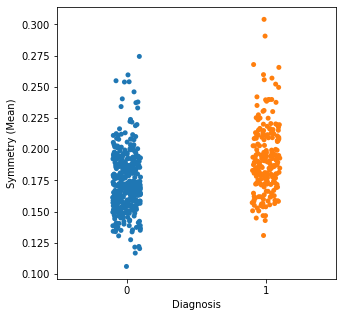

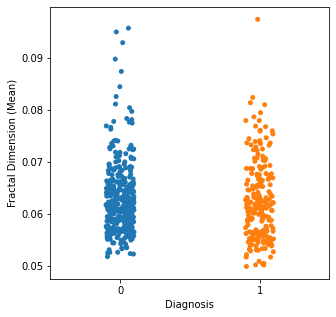

In [20]:
#plot for outlier detection for all features 
#first 10 - Area features  
for index, columns in enumerate(df.drop(columns=["ID"]).iloc[:,:10]):
    plot.figure(index)
    plot.figure(figsize=(5,5))
    sns.stripplot(x='Diagnosis', y= columns, data=df );
  

<Figure size 432x288 with 0 Axes>

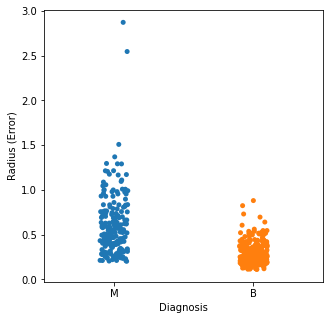

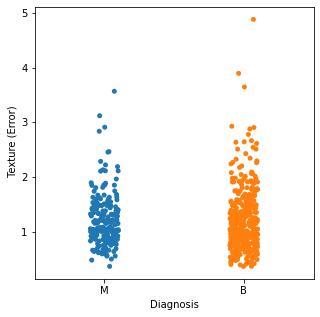

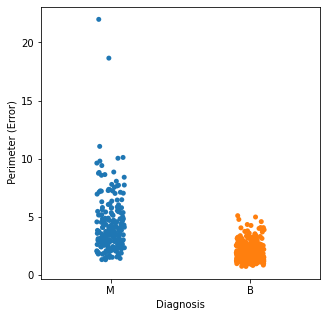

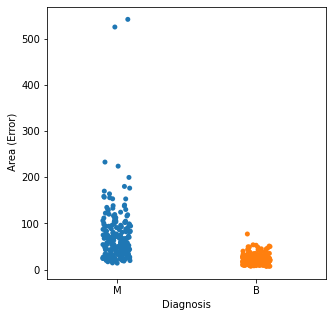

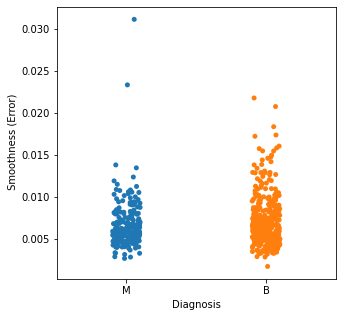

...

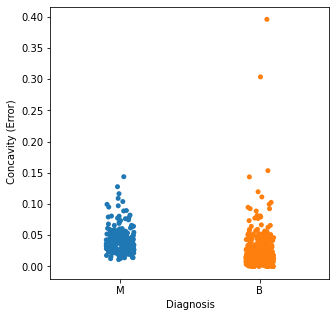

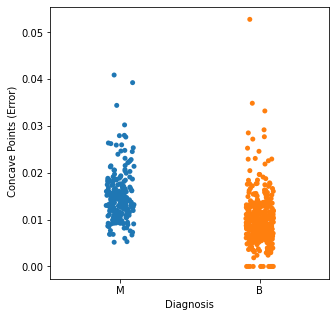

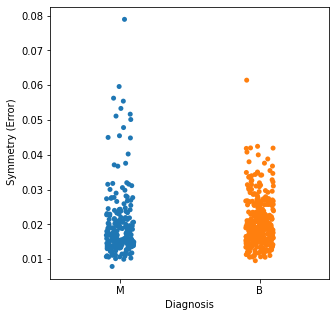

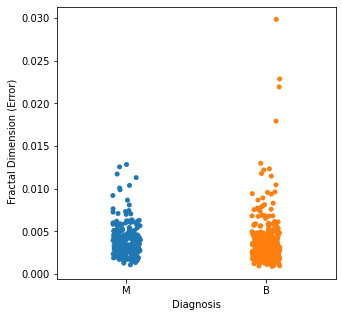

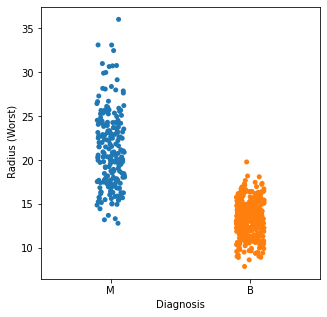

In [19]:
#next 10 - Error features
for index, columns in enumerate(df.drop(columns=["ID"]).iloc[:,10:21]):
    plot.figure(index)
    plot.figure(figsize=(5,5))
    sns.stripplot(x='Diagnosis', y= columns, data=df );


<Figure size 432x288 with 0 Axes>

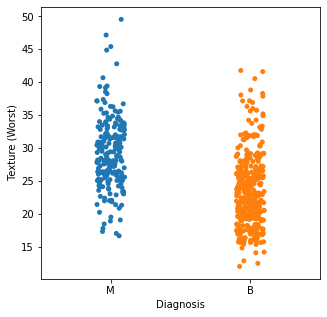

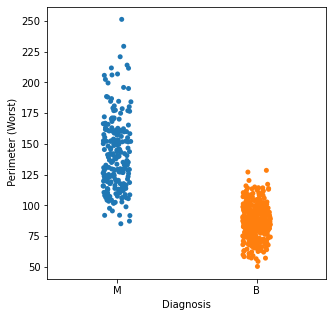

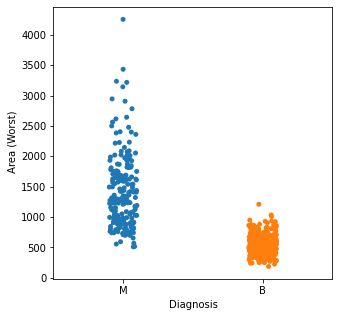

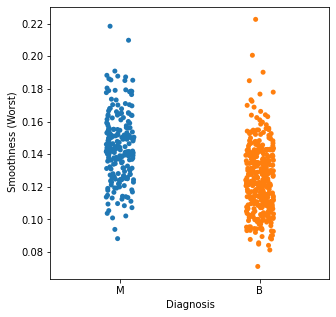

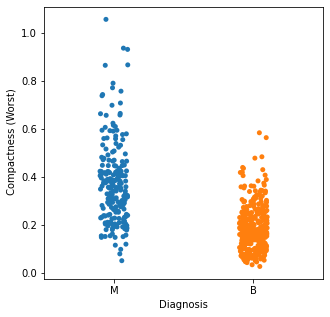

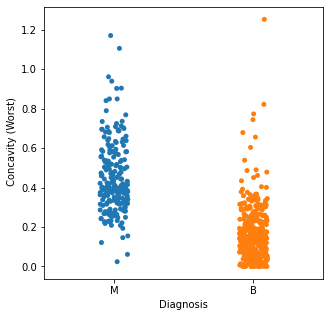

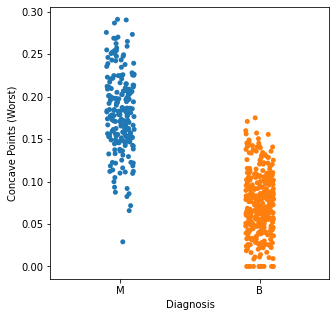

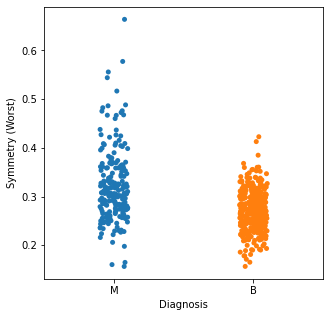

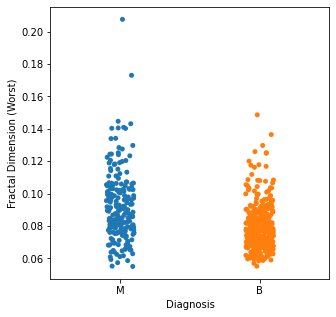

In [20]:
#last 10 - Worst features 
for index, columns in enumerate(df.drop(columns=["ID"]).iloc[:,21:30]):
    plot.figure(index)
    plot.figure(figsize=(5,5))
    sns.stripplot(x='Diagnosis', y= columns, data=df );


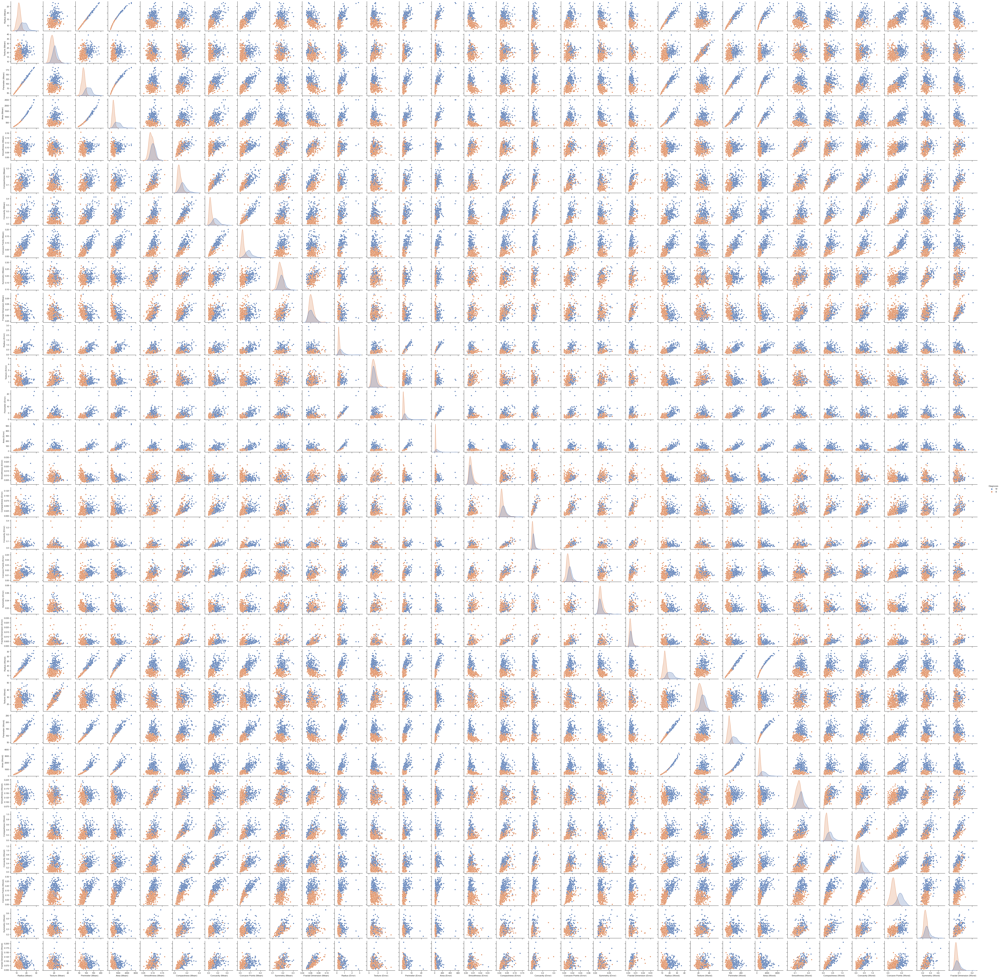

In [21]:
sns.set_theme(style="ticks")
sns.pairplot(df.drop(columns=["ID"]),  hue='Diagnosis');

In [7]:
df = df.fillna(df.median())
df.isnull().sum()

ID                            0
Radius (Mean)                 0
Texture (Mean)                0
Perimeter (Mean)              0
Area (Mean)                   0
Smoothness (Mean)             0
Compactness (Mean)            0
Concavity (Mean)              0
Concave Points (Mean)         0
Symmetry (Mean)               0
Fractal Dimension (Mean)      0
Radius (Error)                0
 Texture (Error)              0
 Perimeter (Error)            0
 Area (Error)                 0
 Smoothness (Error)           0
 Compactness (Error)          0
 Concavity (Error)            0
 Concave Points (Error)       0
 Symmetry (Error)             0
 Fractal Dimension (Error)    0
 Radius (Worst)               0
 Texture (Worst)              0
 Perimeter (Worst)            0
 Area (Worst)                 0
 Smoothness (Worst)           0
 Compactness (Worst)          0
 Concavity (Worst)            0
Concave Points (Worst)        0
Symmetry (Worst)              0
Fractal Dimension (Worst)     0
Diagnosi

In [13]:
# ‘eps’ here is the smallest representable number.
# At times we get log(0) or 0 in the denominator, to avoid that we are going to use this.
eps = np.finfo(float).eps

def get_entropy_for_dataset(df):
    """
    Get entropy for the dataset.
    """
    class_name = df.keys()[-1] # gettig class name from the last column
    values = df[class_name].unique() # getting the values the class can take
    
    entropy = 0
    for value in values:
        # TODO: get probability of value (i.e., the fraction)
        #       - number of instances with the value 'value' in the 'class_name' column
        #       - number of instances in the dataset
        prob_v = df[class_name].value_counts()[value] / len(df)
        
        # TODO: calculate entropy using prob_v
        entropy += -prob_v * np.log2(prob_v)
    
    return entropy


In [14]:
def get_information_gain(df, attribute_name):
    """
    Get information gain for a specific attribute
    """
    
    # Get the class name, class variables and attribute variables
    class_name = df.keys()[-1]
    class_variables = df[class_name].unique()
    attribute_variables = df[attribute_name].unique()
    
    # TODO: get entropy for the dataset
    entropy_dataset = get_entropy_for_dataset(df)
    
    # TODO: get the total number of instances in the dataset
    tot_instances = len(df)
    
    # add up entropy calculation for the attribute values
    sum_attribute_entropy_calc = 0
    
    # iterating over all attribute variables
    for attribute_variable in attribute_variables:
        
        # get the number of instances for the attribute with the given value
        num_attribute_val_instances = len(df[attribute_name][df[attribute_name] == attribute_variable])
        
        # TODO: get the probability (prob_v) of the attribute with the given value
        prob_v = num_attribute_val_instances / tot_instances
        
        # next, calculate the entropy
        entropy = 0
        
        # iterating over all class values
        for class_variable in class_variables:
            # get the number of instances for the attribute, for the given variable, for the given class
            num = len(df[attribute_name][df[attribute_name] == attribute_variable][df[class_name] == class_variable])
            
            # probability of the given attribute value, for the given class
            prob_v_class = num / (num_attribute_val_instances+eps)
            
            # TODO: entropy for the given attribute value
            #       - using prob_v_class
            entropy += -prob_v_class*log(prob_v_class+eps)
        
        # finally, add the entropy calculation for the attribute value
        sum_attribute_entropy_calc += -prob_v*entropy
    
    information_gain = entropy_dataset - abs(sum_attribute_entropy_calc)
    
    return information_gain

In [15]:
def get_subtable(df, attribute_name, value):
    """
    Get a subtable of the dataframe, by dropping rows for the given attribute
    with the given value. It's used to drop instances that have already been classified
    by the current tree (as it's being built, node by node).
    """
    df_sub = df[df[attribute_name] == value].reset_index(drop=True)
    return df_sub

def get_most_informative_attribute(df):
    """
    Gets the most informative attribute, by iterating over all the attributes
    and calculating information gain for them.
    """
    information_gain_list = []
    
    # iterate over all the attributes (features) to get information gain
    for key in df.keys()[:-1]:
        information_gain_list.append(get_information_gain(df, key))
    
    # return the name of the most informative attribute (feature) - with the highest gain value
    return df.keys()[:-1][np.argmax(information_gain_list)]

def build_tree(df,tree=None):
    """
    Iteratively building the tree, using the functions declared above.
    This implementation uses a dictionary as the data structure for the tree.
    """
    
    # get the class name, assuming it's in the final column
    class_name = df.keys()[-1]
    
    # get attribute with maximum information gain
    node = get_most_informative_attribute(df)
    
    # create an empty dictionary to create tree if it doesn't already exist
    if tree is None:                    
        tree={}
        tree[node] = {}
    
    # get distinct values of the given attribute
    attribute_values = np.unique(df[node])
    
    # iterate over all attribute values to build the tree
    for value in attribute_values:
        subtable = get_subtable(df, node, value)
        class_value_array, count_array = np.unique(subtable[class_name], return_counts=True)                        
        
        # check if we have a leaf node or need to continue building the tree
        if len(count_array)==1:
            # only one class value, meaning we have a leaf node and stop recursing
            tree[node][value] = class_value_array[0]                                                    
        else:
            # still instances for multiple classes, so need to recursively continue
            # to build the tree
            tree[node][value] = build_tree(subtable)
    
    # and we're done building the tree, wohoo!
    return tree

In [16]:
tree = build_tree(df.drop(columns=["ID"]))
pprint.pprint(tree)

{'Concave Points (Mean)': {0.0: 'B',
                           0.001852: 'B',
                           0.002404: 'B',
                           0.002924: 'B',
                           0.002941: 'B',
                           0.003125: 'B',
                           0.003261: 'B',
                           0.003333: 'B',
                           0.003472: 'B',
                           0.0041670000000000006: 'B',
                           0.004419: 'B',
                           0.005051: 'B',
                           0.005128: 'B',
                           0.005159: 'B',
                           0.005449: 'B',
                           0.005495: 'B',
                           0.005592: 'B',
                           0.005664: 'B',
                           0.005769: 'B',
                           0.005917: 'B',
                           0.00625: 'B',
                           0.006423000000000001: 'B',
                           0.0064340000000000005: 'B',
  